# <b>Weather forecast project

# Rain in Australia
---
## Predict next-day rain in Australia

#### Dataset source:
https://www.kaggle.com/datasets/jsphyg/weather-dataset-rattle-package

#### Context:
This dataset contains about 10 years of daily weather observations from numerous Australian weather stations.

<b>RainTomorrow is the target variable to predict</b>. It means -- did it rain the next day, Yes or No?
This column is Yes if the rain for that day was 1mm or more.

# Table of contents
1. [Imports & reading dataset ](#1)
2. [Data Description](#2)
3. [Data Analysis](#3)
4. [Data Visualization](#4)

#### Packages nécessaires au notebook :

In [2]:
import numpy as np
import pandas as pd
import matplotlib
import bokeh 
import sys

import seaborn as sns
sns.set_style('darkgrid')
sns.set_palette('Set2')

import matplotlib.pyplot as plt
%matplotlib inline

from datetime import datetime
from termcolor import colored
from IPython.display import Image

#### Version des packages utilisés :

In [3]:
# Cellule désactivée pour afficher les versions utilisée lors de la création du notebook

print(f"NumPy version : {np.__version__}") 
print(f"Pandas version : {pd.__version__}")  
print(f"Seaborn version : {sns.__version__}")  
print(f"Bokeh version : {bokeh.__version__}")  

>   NumPy version : 1.23.5  
Pandas version : 1.5.2  
Seaborn version : 0.12.2  
Bokeh version : 3.0.3  

# 1. Imports and reading dataset <a name="1"></a>

In [4]:
df = pd.read_csv('../data/weatherAUS.csv')
df.columns = df.columns.str.lower()

In [5]:
df.shape

(145460, 23)

In [6]:
df.head()

,date,location,mintemp,maxtemp,rainfall,evaporation,sunshine,windgustdir,windgustspeed,winddir9am,...,humidity9am,humidity3pm,pressure9am,pressure3pm,cloud9am,cloud3pm,temp9am,temp3pm,raintoday,raintomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [7]:
df.tail()

,date,location,mintemp,maxtemp,rainfall,evaporation,sunshine,windgustdir,windgustspeed,winddir9am,...,humidity9am,humidity3pm,pressure9am,pressure3pm,cloud9am,cloud3pm,temp9am,temp3pm,raintoday,raintomorrow
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
145459,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


# 2.Data Description<a name="2"></a>
2.1. [Physical description of variables](#2.1)  
2.2. [Main characterisics](#2)  

## 2.1. Physical description of variables<a name="2.1"></a>

><b>Features</b> :  
* [location : l'emplacement géographique](#2.1.0) 
* [mintemp : la température minimale en degrés Celsius](#2.1.2) 
* [maxtemp : la température maximale en degrés Celsius](#2.1.2) 
* [temp9am : la température à 9h du matin](#2.1.2) 
* [temp3pm : la température à 15h](#2.1.2) 
* [rainfall : la quantité de pluie en millimètres](#2.1.3) 
* [evaporation : l'évaporation en millimètres](#2.1.4) 
* [sunshine : le nombre d'heures de soleil par jour](#2.1.5) 
* [winddir9am : la direction du vent à 9h du matin](#2.1.6) 
* [winddir3pm : la direction du vent à 15h](#2.1.6) 
* [windspeed9am : la vitesse du vent à 9h du matin](#2.1.6) 
* [windspeed3pm : la vitesse du vent à 15h](#2.1.6) 
* [windgustdir : La direction de la rafale de vent la plus forte dans les 24 heures à minuit](#2.1.7) 
* [windgustspeed : La vitesse (km/h) de la rafale de vent la plus forte dans les 24 heures à minuit](#2.1.7) 
* [humidity9am : l'humidité en % à 9h du matin](#2.1.8) 
* [humidity3pm : l'humidité en % à 15h](#2.1.8) 
* [pressure9am : la pression atmosphérique (hpa) réduite au niveau moyen de la mer à 9h](#2.1.9) 
* [pressure3pm : la pression atmosphérique (hpa) réduite au niveau moyen de la mer à 15h](#2.1.9) 
* [cloud9am : le couvert nuageux à 9h du matin](#2.1.10) 
* [cloud3pm : le couvert nuageux à 15h](#2.1.10) 
* [raintoday : s'il y a eu de la pluie aujourd'hui (> 1mm)](#2.1.11) 
><b>Target</b> :  
* [raintomorrow : s'il y a eu de la pluie demain (> 1 mm)](#2.1.12) 

### 2.1.0 The location <a name="2.1.0"></a>

In [8]:
Image(url='http://www.carte-du-monde.net/pays/australie/carte-climat-australie.jpg')

In [9]:
# Villes du dataset
df.location.unique()

array(['Albury', 'BadgerysCreek', 'Cobar', 'CoffsHarbour', 'Moree',
       'Newcastle', 'NorahHead', 'NorfolkIsland', 'Penrith', 'Richmond',
       'Sydney', 'SydneyAirport', 'WaggaWagga', 'Williamtown',
       'Wollongong', 'Canberra', 'Tuggeranong', 'MountGinini', 'Ballarat',
       'Bendigo', 'Sale', 'MelbourneAirport', 'Melbourne', 'Mildura',
       'Nhil', 'Portland', 'Watsonia', 'Dartmoor', 'Brisbane', 'Cairns',
       'GoldCoast', 'Townsville', 'Adelaide', 'MountGambier', 'Nuriootpa',
       'Woomera', 'Albany', 'Witchcliffe', 'PearceRAAF', 'PerthAirport',
       'Perth', 'SalmonGums', 'Walpole', 'Hobart', 'Launceston',
       'AliceSprings', 'Darwin', 'Katherine', 'Uluru'], dtype=object)

<div class= "alert alert-block alert-info">  L'Australie est un pays qui s'étend sur une vaste zone géographique, ce qui explique pourquoi on y observe différents types de climat : tropical, subtropical, désertique, de prairie et de savane, et tempéré. La prévision météo est influencée par de nombreux paramètres, et le climat en est un de particulièrement important. C'est pourquoi nous avons décidé d'ajouter une nouvelle caractéristique au jeu de données que nous utilisons.
</div>
           


In [113]:
# Classement des villes en fonction de leur location climatique (attention, dictionnaire à consolider, notamment différencier les villes "Plaine" vs "Tempéré")
climates = { 'Albury': 'Temperate',
             'Adelaide': 'Temperate',
             'Albany': 'Temperate',
             'AliceSprings': 'Desert',
             'BadgerysCreek': 'Temperate',
             'Ballarat': 'Temperate',
             'Bendigo': 'Temperate',
             'Brisbane': 'Subtropical',
             'Cairns': 'Tropical',
             'Canberra': 'Temperate',
             'Cobar': 'Subtropical',
             'CoffsHarbour': 'Subtropical',
             'Dartmoor': 'Temperate',
             'Darwin': 'Tropical',
             'GoldCoast': 'Subtropical',
             'Hobart': 'Temperate',
             'Katherine': 'Tropical',
             'Launceston': 'Temperate',
             'Melbourne': 'Temperate',
             'MelbourneAirport': 'Temperate',
             'Mildura': 'Temperate',
             'Moree': 'Subtropical',
             'MountGambier': 'Temperate',
             'MountGinini': 'Temperate',
             'Newcastle': 'Temperate',
             'Nhil': 'Temperate',
             'NorahHead': 'Temperate',
             'NorfolkIsland': 'Subtropical',
             'Nuriootpa': 'Temperate',
             'PearceRAAF': 'Temperate',
             'Penrith': 'Temperate',
             'Perth': 'Temperate',
             'PerthAirport': 'Temperate',
             'Portland': 'Temperate',
             'Richmond': 'Temperate',
             'Sale': 'Temperate',
             'SalmonGums': 'Temperate',
             'Sydney': 'Temperate',
             'SydneyAirport': 'Temperate',
             'Townsville': 'Tropical',
             'Tuggeranong': 'Temperate',
             'Uluru': 'Desert',
             'WaggaWagga': 'Temperate',
             'Walpole': 'Temperate',
             'Watsonia': 'Temperate',
             'Williamtown': 'Temperate',
             'Witchcliffe': 'Temperate',
             'Wollongong': 'Temperate',
             'Woomera': 'Desert'}

In [106]:
df['climate'] = df['location'].map(climates)
df[['location', 'climate']].drop_duplicates()

,location,climate
0,Albury,Temperate
3040,BadgerysCreek,Temperate
6049,Cobar,Subtropical
9058,CoffsHarbour,Subtropical
12067,Moree,Subtropical
15076,Newcastle,Temperate
18115,NorahHead,Temperate
21119,NorfolkIsland,Subtropical
24128,Penrith,Temperate
27167,Richmond,Temperate


In [107]:
# Coordonnées GPS des villes du dataframe (normalement ok)
coords = {'Albury': (-36.07, 146.95),
          'BadgerysCreek': (-33.78, 150.70),
          'Cobar': (-31.50, 145.83),
          'CoffsHarbour': (-30.30, 153.12),
          'Moree': (-29.47, 149.85),
          'Newcastle': (-32.92, 151.78),
          'NorahHead': (-33.28, 151.53),
          'NorfolkIsland': (-29.03, 167.95),
          'Penrith': (-33.75, 150.70),
          'Richmond': (-33.60, 150.78),
          'Sydney': (-33.87, 151.21),
          'SydneyAirport': (-33.93, 151.17),
          'WaggaWagga': (-35.12, 147.35),
          'Williamtown': (-32.78, 151.84),
          'Wollongong': (-34.42, 150.89),
          'Canberra': (-35.30, 149.12),
          'Tuggeranong': (-35.40, 149.08),
          'MountGinini': (-35.65, 148.91),
          'Ballarat': (-37.56, 143.85),
          'Bendigo': (-36.75, 144.28),
          'Sale': (-38.10, 147.06),
          'MelbourneAirport': (-37.67, 144.83),
          'Melbourne': (-37.83, 144.98),
          'Mildura': (-34.20, 142.14),
          'Nhil': (-36.65, 146.68),
          'Portland': (-38.35, 141.60),
          'Watsonia': (-37.70, 145.08),
          'Dartmoor': (-37.95, 141.10),
          'Brisbane': (-27.47, 153.03),
          'Cairns': (-16.92, 145.77),
          'GoldCoast': (-28.00, 153.43),
          'Townsville': (-19.25, 146.82),
          'Adelaide': (-34.92, 138.60),
          'MountGambier': (-37.83, 140.78),
          'Nuriootpa': (-34.48, 138.86),
          'Woomera': (-31.16, 136.80),
          'Albany': (-35.02, 117.89),
          'Witchcliffe': (-33.65, 115.35),
          'PearceRAAF': (-31.67, 116.67),
          'PerthAirport': (-31.93, 115.97),
          'Perth': (-31.95, 115.86),
          'SalmonGums': (-33.65, 121.82),
          'Walpole': (-34.97, 116.40),
          'Hobart': (-42.83, 147.50),
          'Launceston': (-41.45, 147.13),
          'AliceSprings': (-23.70, 133.88),
          'Darwin': (-12.46, 130.84),
          'Katherine': (-14.47, 132.27),
          'Uluru': (-25.35, 131.03)}

<div class= "alert alert-block alert-info"> Les caractéristiques géographiques de l'Australie, comme ses côtes, ses montagnes, ses déserts, ses îles et ses vallées, ont un impact sur les prévisions météorologiques du pays. C'est pourquoi nous avons décidé d'ajouter ces informations au jeu de données que nous utilisons
</div>

In [108]:
# caractéristiques géographiques (attention, il y a des coquilles, dictionnaire à consolider)
geography = {
    'Albury': 'coastal',
    'BadgerysCreek': 'coastal',
    'Cobar': 'mountainous',
    'CoffsHarbour': 'coastal',
    'Moree': 'mountainous',
    'Newcastle': 'mountainous',
    'NorahHead': 'coastal',
    'NorfolkIsland': 'island',
    'Penrith': 'coastal',
    'Richmond': 'coastal',
    'Sydney': 'coastal',
    'SydneyAirport': 'coastal',
    'WaggaWagga': 'valley',
    'Williamtown': 'mountainous',
    'Wollongong': 'coastal',
    'Canberra': 'mountainous',
    'Tuggeranong': 'mountainous',
    'MountGinini': 'mountainous',
    'Ballarat': 'mountainous',
    'Bendigo': 'mountainous',
    'Sale': 'mountainous',
    'MelbourneAirport': 'mountainous',
    'Melbourne': 'mountainous',
    'Mildura': 'mountainous',
    'Nhil': 'mountainous',
    'Portland': 'mountainous',
    'Watsonia': 'mountainous',
    'Dartmoor': 'mountainous',
    'Brisbane': 'mountainous',
    'Cairns': 'mountainous',
    'GoldCoast': 'mountainous',
    'Townsville': 'coastal',
    'Adelaide': 'coastal',
    'MountGambier': 'mountainous',
    'Nuriootpa': 'mountainous',
    'Woomera': 'mountainous',
    'Albany': 'coastal',
    'Witchcliffe': 'coastal',
    'PearceRAAF': 'coastal',
    'PerthAirport': 'coastal',
    'Perth': 'coastal',
    'SalmonGums': 'valley',
    'Walpole': 'mountainous',
    'Hobart': 'coastal',
    'Launceston': 'mountainous',
    'AliceSprings': 'desert',
    'Darwin': 'desert',
    'Katherine': 'desert',
    'Uluru': 'desert'
}


In [109]:
df['geography'] = df['location'].map(geography)
df[['location', 'climate', 'geography']].drop_duplicates()

,location,climate,geography
0,Albury,Temperate,coastal
3040,BadgerysCreek,Temperate,coastal
6049,Cobar,Subtropical,mountainous
9058,CoffsHarbour,Subtropical,coastal
12067,Moree,Subtropical,mountainous
15076,Newcastle,Temperate,mountainous
18115,NorahHead,Temperate,coastal
21119,NorfolkIsland,Subtropical,island
24128,Penrith,Temperate,coastal
27167,Richmond,Temperate,coastal


In [110]:
df['coords'] = df['location'].map(coords)

# Fonction qui extrait les coordonnées
def extract_coords(coords_str):
    coords = coords_str[1:-1].split(', ')
    return float(coords[0]), float(coords[1])

# Ajout des coordonnées GPS X et Y au DataFrame
df['coords'] = df['coords'].astype(str)
df['coords_x'] = df['coords'].apply(lambda x: extract_coords(x)[0])
df['coords_y'] = df['coords'].apply(lambda x: extract_coords(x)[1])

df_ville = df[['location', 'climate', 'coords', 'coords_x','coords_y', 'geography']].drop_duplicates()

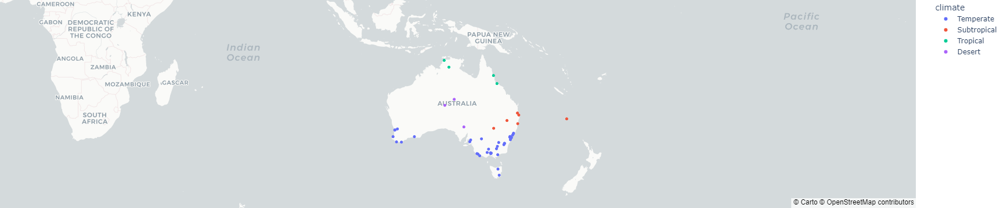

In [124]:
# Figure Plotly qui permet d'afficher la ville, le climat et les coordonnées GPS en survolant le point
fig = px.scatter_mapbox(df_ville, lat='coords_x', lon='coords_y', color='climate', title='Climats des villes en Australie', hover_name='location', hover_data=['geography'])

# Référence de tuile
fig.update_layout(mapbox_style='carto-positron')

# Limites de la carte et le zoom de départ
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0}, mapbox_center_lat=-25, mapbox_center_lon=135, mapbox_zoom=2)

fig.show()

### 2.1.1 The date of observation<a name="2.1.1"></a>

The seasonality of Australia is important for weather forecast.  
The seasons are reversed compared to the northern hemisphere :

>* <b>Summer</b> : December, January, February  
>* <b>Autumn</b> : March, April, May  
>* <b>Winter</b> : June, July, August  
>* <b>Spring</b> : September, October, November  

In [70]:
# le type de la date est à changer en date time
print('Type initial de la date :' ,df.date.dtype)
df['date'] = pd.to_datetime(df['date'])
print('Type final de la date :' ,df.date.dtype)

Type initial de la date : datetime64[ns]
Type final de la date : datetime64[ns]


In [71]:
# column for the month 
df['month'] = df['date'].apply(lambda x: x.month)

# column for 'season' with values 'Winter', 'Spring', 'Summer', or 'Autumn' based on the month 
df['season'] = df['month'].apply(lambda x: 'summer' if x in [12, 1, 2] else 'autumn' if x in [3, 4, 5] else 'winter' if x in [6, 7, 8] else 'spring')

# Group the DataFrame by the 'season' column and compute the mean for each group
df_by_season = df.drop(columns=['month']).groupby('season').mean(numeric_only=True)


In [68]:
df_by_season

,mintemp,maxtemp,rainfall,evaporation,sunshine,windgustspeed,windspeed9am,windspeed3pm,humidity9am,humidity3pm,pressure9am,pressure3pm,cloud9am,cloud3pm,temp9am,temp3pm
season,,,,,,,,,,,,,,,,
autumn,11.774492,23.493781,1.920738,6.249843,8.283808,42.550451,15.384192,20.251493,63.126116,48.529629,1017.264186,1014.736736,4.320871,4.340719,17.524545,21.755337
spring,12.794586,23.516854,2.385703,4.689332,7.021882,37.337595,12.876521,17.333413,72.161605,52.604955,1018.921569,1016.491949,4.481671,4.632428,17.199875,22.124266
summer,7.414271,17.429008,2.341573,2.934362,6.275292,37.890858,13.031874,17.347195,76.160730,57.184493,1020.652592,1018.213291,4.436563,4.661166,11.589656,16.253795
winter,16.980005,28.705930,2.798932,8.195689,8.949226,42.711195,15.032178,19.902913,63.530563,47.507581,1013.482792,1011.311902,4.551185,4.378593,21.892163,26.839784


In [116]:
df_by_season_month = df.groupby(['season', 'month']).mean(numeric_only=True)
print(colored("Mean for each value by month and season :", 'grey', attrs=['bold']))
df_by_season_month

Mean for each value by month and season :


mintemp    maxtemp  rainfall  evaporation  sunshine  \
season month                                                          
autumn 3      15.913305  26.885273  2.814450     6.226357  7.627229   
       4      12.843618  23.625035  2.334823     4.533415  7.080942   
       5       9.640925  20.065173  2.001654     3.245673  6.321179   
spring 9       9.466875  20.752012  1.888543     4.910757  7.685301   
       10     11.531224  23.537153  1.614732     6.375352  8.490807   
       11     14.321606  26.181247  2.268177     7.463632  8.666098   
summer 1      17.535535  29.532383  2.738478     8.756285  9.203301   
       2      17.503588  28.873509  3.188665     7.634513  8.590477   
       12     15.811322  27.558321  2.491835     8.076262  8.997794   
winter 6       7.818067  17.307648  2.782182     2.512956  5.645576   
       7       6.944633  16.744580  2.184209     2.691435  6.052353   
       8       7.459653  18.241013  2.034983     3.607026  7.136923   

              windgustspeed  windspeed9am  windspeed3pm  humidity9am  \
season month                                                           
autumn 3          39.599356     13.332753     18.466672    70.816985   
       4          36.505243     12.877838     17.153968    70.803854   
       5          35.803096     12.420218     16.356048    74.675386   
spring 9          42.294806     15.478037     20.175620    64.944760   
       10         42.730828     15.435518     20.490943    62.670601   
       11         42.617647     15.238240     20.080046    61.787145   
summer 1          43.396456     15.335356     20.186773    62.331667   
       2          41.498998     14.411638     19.234714    67.018111   
       12         43.071686     15.274989     20.215366    61.568847   
winter 6          35.560891     12.293303     15.870799    79.406630   
       7          37.963884     12.977923     17.347654    77.488055   
       8          40.280165     13.868044     18.911306    71.420059   

              humidity3pm  pressure9am  pressure3pm  cloud9am  cloud3pm  \
season month                                                              
autumn 3        50.357165  1016.766232  1014.551846  4.490458  4.493844   
       4        52.219453  1019.641567  1017.043485  4.496956  4.688659   
       5        55.187292  1020.449787  1017.949934  4.459665  4.722598   
spring 9        50.334514  1018.039954  1015.251349  4.131386  4.272067   
       10       47.406063  1018.338814  1015.883326  4.197266  4.191962   
       11       47.889799  1015.385387  1013.041614  4.637376  4.564841   
summer 1        46.443769  1012.794733  1010.613441  4.489372  4.237527   
       2        48.984888  1014.499906  1012.378532  4.508100  4.407775   
       12       47.339779  1013.317432  1011.109731  4.667516  4.517149   
winter 6        60.540855  1021.200465  1018.879716  4.744507  4.897285   
       7        58.005207  1021.121071  1018.730487  4.454439  4.692623   
       8        52.816025  1019.603766  1016.991759  4.094023  4.384092   

                temp9am    temp3pm  
season month                        
autumn 3      19.888484  25.343573  
       4      17.680004  22.239993  
       5      14.116108  18.822236  
spring 9      15.350247  19.188121  
       10     17.252736  21.796762  
       11     19.970794  24.272204  
summer 1      22.532823  27.637489  
       2      21.791693  27.124375  
       12     21.225267  25.612047  
winter 6      11.565653  16.186395  
       7      10.830630  15.631336  
       8      12.372772  16.951018

### 2.1.2 The temperature<a name="2.1.2"></a>

La température joue un rôle important dans la formation de pluie. Lorsque l'air est chaud et humide, il peut contenir une grande quantité de vapeur d'eau. Si cet air chaud et humide est refroidi, il peut perdre de l'humidité sous forme de pluie.

La température peut influencer la formation de pluie de différentes manières. Elle peut influencer la température de l'air et, par conséquent, sa capacité à contenir de la vapeur d'eau :
* Plus l'air est chaud, plus il peut contenir de vapeur d'eau. 
* Lorsque l'air se refroidit, il peut perdre de l'humidité sous forme de pluie.

In [117]:
print('\n')
print(colored("Temperature description :", 'grey', attrs=['bold']))
display(df[['mintemp', 'maxtemp']].describe())
print('\n')
print(colored("Minimum temperature description by season :", 'blue', attrs=['bold']))
display(df.groupby('season')['mintemp'].describe())
print('\n')
print(colored("Maximal temperature description by season :", 'red', attrs=['bold']))
display(df.groupby('season')['maxtemp'].describe())



Temperature description :


,mintemp,maxtemp
count,143975.000000,144199.000000
mean,12.194034,23.221348
std,6.398495,7.119049
min,-8.500000,-4.800000
25%,7.600000,17.900000
50%,12.000000,22.600000
75%,16.900000,28.200000
max,33.900000,48.100000




Minimum temperature description by season :


,count,mean,std,min,25%,50%,75%,max
season,,,,,,,,
autumn,37826.0,12.794586,5.776155,-6.9,8.8,12.7,16.9,29.6
spring,35052.0,11.774492,5.732031,-6.8,7.8,11.5,15.5,30.3
summer,34688.0,16.980005,4.975866,-3.0,13.5,17.2,20.5,33.9
winter,36409.0,7.414271,5.176994,-8.5,4.0,7.3,10.5,26.6




Maximal temperature description by season :


,count,mean,std,min,25%,50%,75%,max
season,,,,,,,,
autumn,37901.0,23.516854,5.884863,-3.1,19.4,23.2,27.5,43.0
spring,35084.0,23.493781,6.512848,-2.5,18.7,22.7,28.0,45.5
summer,34738.0,28.705930,5.959204,3.8,24.3,28.4,32.7,48.1
winter,36476.0,17.429008,5.233846,-4.8,14.1,16.9,19.9,37.5


> <div class= "alert alert-block alert-info"> <b>La différence de température entre le maximum et le minimum peut avoir une influence sur la prévision de pluie</b>, car elle peut être liée à l'instabilité atmosphérique.  
    Lorsque la différence de température entre le maximum et le minimum est importante, cela peut indiquer une instabilité atmosphérique accrue, ce qui peut entraîner des conditions plus nuageuses et plus propices à la pluie. À l'inverse, lorsque la différence de température est faible, cela peut indiquer une atmosphère plus stable, ce qui peut entraîner moins de nuages et moins de pluie.
</div>

Les classes de stabilité atmosphérique décrivent l'état de l'atmosphère en termes de stabilité thermique :  
* Plus l'atmosphère est stable, moins les mouvements d'air et les perturbations atmosphériques sont susceptibles de se produire. 
* Plus l'<b>atmosphère est instable</b>, plus elle est propice aux mouvements d'air et aux perturbations atmosphériques tels que les nuages et les précipitations.

Il existe plusieurs classes de stabilité atmosphérique, qui sont déterminées en fonction du gradient de température. Par exemple, une atmosphère stable est caractérisée par un gradient de température faible, tandis qu'une atmosphère instable est caractérisée par un gradient de température élevé.

La différence de température entre le maximum et le minimum est liée au gradient de température dans l'atmosphère en ce sens qu'elle peut indiquer l'instabilité atmosphérique. Plus la différence de température est importante, plus l'atmosphère est instable.

### 2.1.3 The rainfall<a name="2.1.3"></a>

La forme la plus importante et la plus dominante de la pluie est <b>la pluie convective</b>. Il est connu dans les régions de haute latitude comme le tropical et le subtropical. Il est généralement observé avec des éclairs et des orages.  

<b>La pluie conventionnelle</b> est un type de pluie qui est affecté par les montagnes et les régions montagneuses ; car c'est la forme de pluie la plus dominante et elle dépend de la latitude (Collier, 2003). La formation des précipitations conventionnelles se produit lorsque l'air à la surface de la terre devient intense par la chaleur du soleil. L'air chaud est plus léger que l'air frais, il s'évapore donc de la surface de la terre et forme des nuages dans l'atmosphère. Plus les vapeurs d'eau s'élèvent, plus ces vapeurs se déplacent progressivement vers le haut vers la zone d'air convergent et forment des nuages épais et lourds. Les nuages lourds et instables montent encore et l'instabilité de ces nuages les oblige alors à retomber à la surface de la terre sous forme de pluie conventionnelle (Selase, Agyimpomaa, Selasi, & Hakii, Precipitation and Rainfall Types with Their Characteristic Features, 2015).  

<b>La pluie orographique</b> est la forme de pluie formée par l'air humide que l'on peut généralement observer au-dessus des montagnes. L'air humide au-dessus des montagnes est évaporé ou soulevé vers le haut. Lorsque l'air humide est soulevé et atteint un certain niveau, il se refroidit ; les nuages orographiques se forment puis se condensent et forment la précipitation. La pluviométrie orographique est formée par les terres de latitude moyenne comme celle à grandes montagnes (Gray & Seed, 2006). La pluie orographique a de minuscules gouttes d'eau qui se condensent. Ces petites gouttes d'eau des nuages, puis ces petits nuages se rassemblent pour former de plus gros nuages. Ces nuages se transforment également en neige au bout d'un certain temps (Jr., 2012). Les précipitations orographiques sont observées sur les montagnes des latitudes moyennes avec un axe perpendiculaire à la direction du vent dominant. Ces directions provoquent des transitions abruptes des précipitations et pourraient être mieux observées avec deux chaînes adjacentes de la montagne pour faire circuler davantage l'air humide. Les plus stables et ceux-ci sont expérimentés principalement dans l'après-midi des étés avec des orages dynamiques. La formation discrète de précipitations orographiques est parfois également observée sur les petites montagnes (Roe, 2005). Les précipitations orographiques sont dues au soulèvement de masses d'air par le vent (Smith & Evans, 2007).

<b>La pluie cyclonique ou frontale</b> est le dernier et troisième type de pluie. Le cyclonique par son nom représente la tempête et se produit lorsque les masses d'air aux caractéristiques distinctes entrent en collision les unes avec les autres. La collision de l'air léger qui est chaud et de l'air froid qui est lourd se produit ; l'air froid favorise l'air chaud car il est plus léger à monter. L'air ascendant se refroidit en formant des vapeurs d'eau. Le processus de condensation initie et forme les nuages (Thatcher, Takayabu, Yokoyama, & Pu, 2012). La formation de nuages devient lourde lorsqu'ils rencontrent d'autres nuages et ces nuages lourds deviennent instables et retombent sur la terre sous forme de précipitations cycloniques. Les précipitations cycloniques sont courantes dans les zones tropicales avec 23% de degrés de latitude nord et sud de l'équateur avec la latitude de la zone tempérée de 66% degrés nord et sud. C'est la raison pour laquelle elle est également connue sous le nom de pluie frontale (Thatcher, Takayabu, Yokoyama et Pu, 2012). Les précipitations frontales/cycloniques ont une période et un moment spécifiques où elles sont plus dominantes et les précipitations sont plus rapides et concentrées. La pluie cyclonique/frontale peut avoir des précipitations prolongées qui pourraient être prolongées et garder le temps humide pendant des journées entières. C'est une distribution de type lognormal et sa distribution dépend de la zone de précipitation (Cheng & Qi, 2001).

> <b>La répartition des formes de précipitations en Australie</b> :
> * La pluie convective est la forme la plus courante, en particulier dans les régions tropicales et subtropicales du nord et de l'est du pays. Les orages convectifs sont fréquents pendant la saison des pluies (de novembre à avril) et peuvent être très intenses, avec de fortes pluies, des éclairs et des vents violents.
> 
> * La pluie conventionnelle est également assez courante, en particulier dans les régions de haute altitude et de montagne. Cette forme de précipitation se produit lorsque l'air chaud à la surface de la terre est soulevé par le soleil et forme des nuages dans l'atmosphère. Lorsque ces nuages deviennent assez lourds et instables, ils se déplacent vers le bas et tombent sous forme de pluie conventionnelle
> 
> * La pluie orographique est principalement observée dans les régions de montagne et de haute altitude, en particulier dans les États de Victoria et de Nouvelle-Galles du Sud. Cette forme de pluie se produit lorsque l'air humide est soulevé par les montagnes et se refroidit, formant des nuages qui se condensent et tombent sous forme de pluie.
> 
> * La pluie cyclonique ou frontale est principalement observée dans les régions côtières, en particulier dans le nord et l'est du pays. Cette forme de pluie se produit lorsque deux masses d'air de caractéristiques différentes entrent en collision, soulevant l'air chaud et formant des nuages qui se condensent et tombent sous forme de pluie. Les cyclones tropicaux sont également une source fréquente de pluie cyclonique en Australie, en particulier dans le nord du pays.
>
> En résumé, la proportion de pluie reçue en Australie dépend de la région et de la période de l'année, mais la pluie convective est généralement la forme la plus courante de précipitation dans les régions tropicales et subtropicales, tandis que la pluie conventionnelle et orographique sont plus courantes dans les régions de montagne et de haute altitude, et la pluie cyclonique est principalement observée dans les régions côtières. 

En Australie, le régime des précipitations est fortement lié aux saisons. Comparée aux autres masses continentales, l'Australie est l'une des plus arides. <b>Plus de 80 % de sa surface connaît une pluviométrie annuelle inférieure à 600 millimètres</b>
E
n passant à un autre extrême, certaines côtes nord du Queensland ont des moyennes annuelles de plus de 4 000 mm, le record australien de 12 461 mm ayant été atteint en 2000 au sommet du Mount Bellenden Ker, qui possède aussi depuis 1986 le record mondial de précipitations en 8 jours avec 3 847 mm.

En Australie, les précipitations varient considérablement d'une région à l'autre en raison de facteurs tels que la distance de la côte, l'altitude et la proximité de zones montagneuses. 

Cependant, en général, l'Australie est un pays à précipitations relativement faibles, avec une moyenne annuelle de pluie inférieure à 600 mm pour la plupart des régions. 

<b>En général, les précipitations sont plus élevées dans les régions côtières et les zones montagneuses et plus faibles dans les régions intérieures et désertiques.</b>

la moyenne de la quantité de pluie varie en fonction de la saison, avec une moyenne plus élevée en été et en automne et une moyenne plus faible en printemps et en hiver. 
la pluie peut varier considérablement d'un mois à l'autre, même au sein de la même saison.

In [141]:
df.groupby(df['date'].dt.year)['rainfall'].sum()

date
2007      196.4
2008     5149.0
2009    35949.0
2010    44518.8
2011    42791.6
2012    36346.9
2013    36583.4
2014    34210.4
2015    37234.1
2016    41742.4
2017    20998.2
Name: rainfall, dtype: float64

On constate que les cumuls annuels du dataset sont plus élévés que la moyenne annuelle nationale

In [134]:
print(colored("Rainfall description by season :", 'grey', attrs=['bold']))
display(df.groupby(['season'])['rainfall'].describe())
print('\n')
print(colored("Rainfall description by season and month :", 'grey', attrs=['bold']))
display(df.groupby(['season', 'month'])['rainfall'].describe())
print('\n')

Rainfall description by season :


,count,mean,std,min,25%,50%,75%,max
season,,,,,,,,
autumn,37399.0,2.385703,8.682182,0.0,0.0,0.0,0.6,240.0
spring,34612.0,1.920738,6.678202,0.0,0.0,0.0,0.6,371.0
summer,34254.0,2.798932,10.941126,0.0,0.0,0.0,0.4,367.6
winter,35934.0,2.341573,6.967667,0.0,0.0,0.0,1.2,219.6




Rainfall description by season and month :


count      mean        std  min  25%  50%    75%    max
season month                                                           
autumn 3      13038.0  2.814450  10.257757  0.0  0.0  0.0  0.600  165.2
       4      11303.0  2.334823   8.706935  0.0  0.0  0.0  0.600  240.0
       5      13058.0  2.001654   6.700027  0.0  0.0  0.0  0.800  182.6
spring 9      11347.0  1.888543   5.443458  0.0  0.0  0.0  0.800   83.8
       10     11811.0  1.614732   6.024018  0.0  0.0  0.0  0.400  206.2
       11     11454.0  2.268177   8.233090  0.0  0.0  0.0  0.575  371.0
summer 1      12914.0  2.738478  11.092289  0.0  0.0  0.0  0.200  278.4
       2      10525.0  3.188665  12.718364  0.0  0.0  0.0  0.400  367.6
       12     10815.0  2.491835   8.636309  0.0  0.0  0.0  0.600  206.8
winter 6      12392.0  2.782182   8.651332  0.0  0.0  0.0  1.400  219.6
       7      11779.0  2.184209   5.869346  0.0  0.0  0.0  1.400  111.0
       8      11763.0  2.034983   5.886269  0.0  0.0  0.0  1.200  192.0

### 2.1.4 The evaporation<a name="2.1.4"></a>

L'évaporation peut affecter le taux d'humidité de l'air et la quantité de pluie qui tombe. L'évaporation est généralement plus importante dans les régions chaudes et humides, et peut être influencée par divers facteurs tels que la température, l'humidité et le vent.

In [133]:
print(colored("Evaporation description by season :", 'grey', attrs=['bold']))
display(df.groupby(['season'])['evaporation'].describe())
print('\n')
print(colored("Evaporation description by season and month :", 'grey', attrs=['bold']))
display(df.groupby(['season', 'month'])['evaporation'].describe())
print('\n')

Evaporation description by season :


,count,mean,std,min,25%,50%,75%,max
season,,,,,,,,
autumn,21512.0,4.689332,3.250365,0.0,2.6,4.0,6.2,65.4
spring,20356.0,6.249843,4.149833,0.0,3.6,5.6,8.0,86.2
summer,19811.0,8.195689,4.812245,0.0,5.4,7.4,10.0,145.0
winter,20991.0,2.934362,2.286397,0.0,1.4,2.4,4.0,55.0




Evaporation description by season and month :


count      mean       std  min  25%  50%   75%    max
season month                                                        
autumn 3      7607.0  6.226357  3.635647  0.0  4.0  5.8   7.8   65.4
       4      6509.0  4.533415  2.926941  0.0  2.8  4.0   5.8   55.6
       5      7396.0  3.245673  2.249718  0.0  1.6  2.8   4.2   28.4
spring 9      6740.0  4.910757  3.248627  0.0  2.8  4.2   6.4   50.8
       10     6893.0  6.375352  3.945377  0.0  4.0  5.8   8.0   68.8
       11     6723.0  7.463632  4.724406  0.0  4.8  6.8   9.0   86.2
summer 1      7462.0  8.756285  5.016234  0.0  6.0  8.0  10.6   82.4
       2      6131.0  7.634513  4.229116  0.0  5.0  7.0   9.2   72.2
       12     6218.0  8.076262  5.025489  0.0  5.2  7.4  10.0  145.0
winter 6      6985.0  2.512956  1.967098  0.0  1.2  2.0   3.4   20.6
       7      7075.0  2.691435  2.167331  0.0  1.2  2.2   3.6   46.2
       8      6931.0  3.607026  2.539167  0.0  2.0  3.0   4.6   55.0

### 2.1.5 The sunshine <a name="2.1.5"></a>

L'ensoleillement est une mesure de la durée pendant laquelle le soleil est visible dans le ciel. Il est généralement mesuré en heures.  
L'ensoleillement est souvent utilisé dans le domaine de la météorologie pour caractériser le climat d'une région et pour prévoir le temps.

In [135]:
print(colored("Sunshine description by season :", 'grey', attrs=['bold']))
display(df.groupby(['season'])['sunshine'].describe())
print('\n')
print(colored("Sunshine description by season and month :", 'grey', attrs=['bold']))
display(df.groupby(['season', 'month'])['sunshine'].describe())
print('\n')

Sunshine description by season :


,count,mean,std,min,25%,50%,75%,max
season,,,,,,,,
autumn,19637.0,7.021882,3.501542,0.0,4.4,7.9,10.0,12.7
spring,18589.0,8.283808,3.618809,0.0,6.0,9.3,11.1,14.2
summer,18336.0,8.949226,4.065934,0.0,6.3,10.3,12.3,14.5
winter,19063.0,6.275292,3.353083,0.0,3.6,6.8,9.2,11.7




Sunshine description by season and month :


count      mean       std  min   25%   50%   75%   max
season month                                                         
autumn 3      7077.0  7.627229  3.635306  0.0  5.00   8.7  10.8  12.7
       4      5945.0  7.080942  3.393828  0.0  4.60   8.1  10.1  11.9
       5      6615.0  6.321179  3.320297  0.0  3.65   7.0   9.3  11.8
spring 9      6116.0  7.685301  3.259875  0.0  5.50   8.7  10.5  11.9
       10     6320.0  8.490807  3.554349  0.0  6.30   9.6  11.4  13.4
       11     6153.0  8.666098  3.934820  0.0  6.00   9.7  12.0  14.2
summer 1      6968.0  9.203301  4.093695  0.0  6.60  10.6  12.7  14.3
       2      5702.0  8.590477  3.982841  0.0  6.10   9.9  12.0  13.7
       12     5666.0  8.997794  4.089109  0.0  6.20  10.2  12.5  14.5
winter 6      6363.0  5.645576  3.334466  0.0  2.90   6.0   8.7  11.3
       7      6395.0  6.052353  3.292846  0.0  3.40   6.5   9.0  11.5
       8      6305.0  7.136923  3.253495  0.0  4.90   7.9  10.0  11.7

In [139]:
df[~df.sunshine.isnull()].sunshine

6049      12.3
6050      13.0
6051      13.3
6052      10.6
6053      12.2
          ... 
142298    11.0
142299     8.6
142300    11.0
142301    10.6
142302    10.7
Name: sunshine, Length: 75625, dtype: float64

### 2.1.6 The wind <a name="2.1.6"></a>

### 2.1.7 The windgust<a name="2.1.7"></a>

### 2.1.8 The hulidity<a name="2.1.8"></a>

### 2.1.9 The pressure<a name="2.1.9"></a>

### 2.1.10 The cloud<a name="2.1.10"></a>

## 2.Main characteristics<a name="2.2"></a>

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   date           145460 non-null  object 
 1   location       145460 non-null  object 
 2   mintemp        143975 non-null  float64
 3   maxtemp        144199 non-null  float64
 4   rainfall       142199 non-null  float64
 5   evaporation    82670 non-null   float64
 6   sunshine       75625 non-null   float64
 7   windgustdir    135134 non-null  object 
 8   windgustspeed  135197 non-null  float64
 9   winddir9am     134894 non-null  object 
 10  winddir3pm     141232 non-null  object 
 11  windspeed9am   143693 non-null  float64
 12  windspeed3pm   142398 non-null  float64
 13  humidity9am    142806 non-null  float64
 14  humidity3pm    140953 non-null  float64
 15  pressure9am    130395 non-null  float64
 16  pressure3pm    130432 non-null  float64
 17  cloud9am       89572 non-null

In [14]:
df.describe()

,mintemp,maxtemp,rainfall,evaporation,sunshine,windgustspeed,windspeed9am,windspeed3pm,humidity9am,humidity3pm,pressure9am,pressure3pm,cloud9am,cloud3pm,temp9am,temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


In [15]:
df.isnull().sum()

date                 0
location             0
mintemp           1485
maxtemp           1261
rainfall          3261
evaporation      62790
sunshine         69835
windgustdir      10326
windgustspeed    10263
winddir9am       10566
winddir3pm        4228
windspeed9am      1767
windspeed3pm      3062
humidity9am       2654
humidity3pm       4507
pressure9am      15065
pressure3pm      15028
cloud9am         55888
cloud3pm         59358
temp9am           1767
temp3pm           3609
raintoday         3261
raintomorrow      3267
dtype: int64

In [16]:
# !pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [17]:
import pandas_profiling as pp
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]